In [3]:
import pandas as pd
import matplotlib.pyplot  as plt
import numpy as np
import os
from statsmodels.tsa.seasonal import seasonal_decompose
from pylab import rcParams
from statsmodels.tsa.stattools import adfuller
from sklearn.ensemble import RandomForestRegressor
from numpy import asarray
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from tqdm import tqdm
from sklearn.metrics import mean_absolute_percentage_error, mean_absolute_error, mean_squared_error, r2_score
from math import sqrt
import warnings
import random
import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils.data as torch_data

random.seed(1)
np.random.seed(1)
torch.manual_seed(1)
torch.cuda.manual_seed(1)
torch.backends.cudnn.deterministic = True

data_target = pd.read_csv('dataset time$ для finallu project/power.csv')
data_features = pd.read_csv('dataset time$ для finallu project/features.csv')

data = pd.merge(data_features, data_target, on='Timestamp')

missing_values = data.isnull().sum()
missing_values = pd.DataFrame(missing_values[missing_values>0])

# Преобразование столбца timestamp в тип данных datetime
data['Timestamp'] = pd.to_datetime(data['Timestamp'])

for column in missing_values.index:
    data[column].fillna(method='ffill', inplace=True)
    data[column] = data[column].rolling(window=5, min_periods=1).mean()


/var/folders/k_/ygbwpkdn4dn6f0kwtbykqvz00000gn/T/ipykernel_29651/2282435951.py:40: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data[column].fillna(method='ffill', inplace=True)


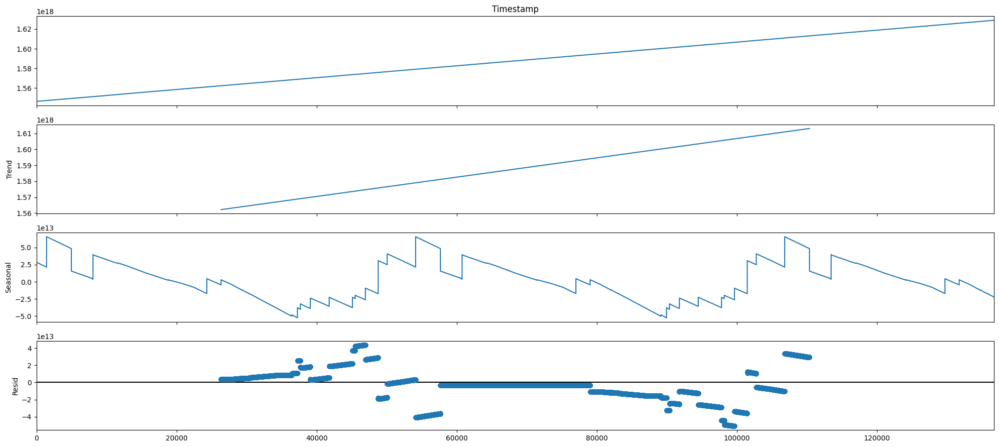

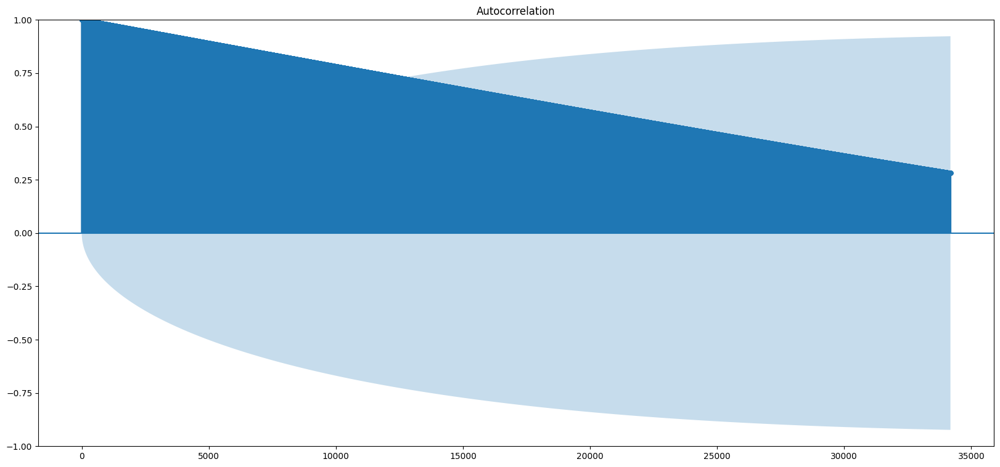

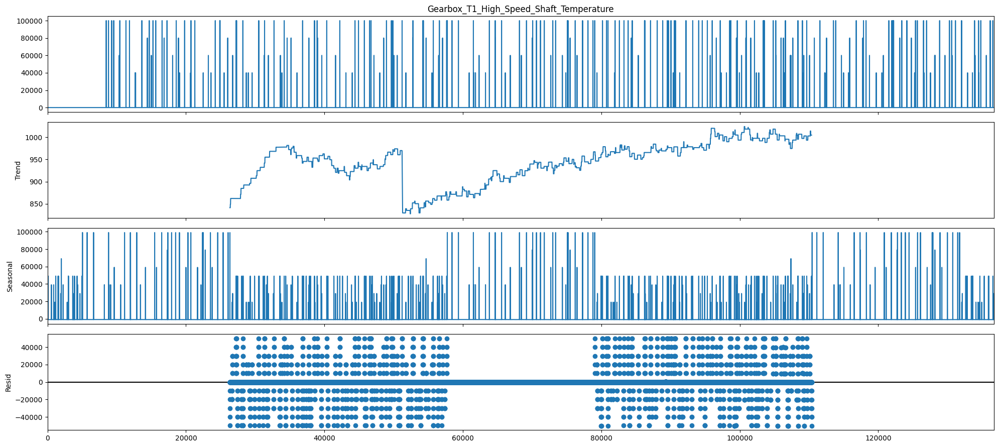

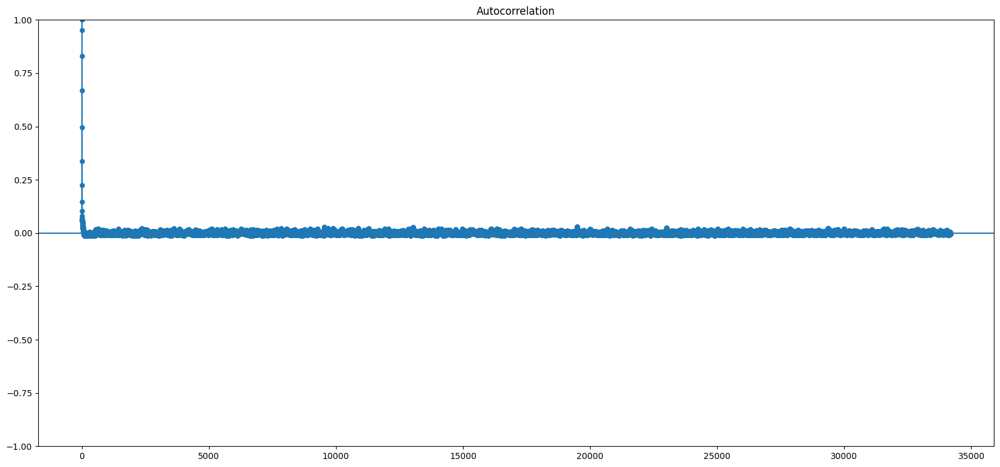

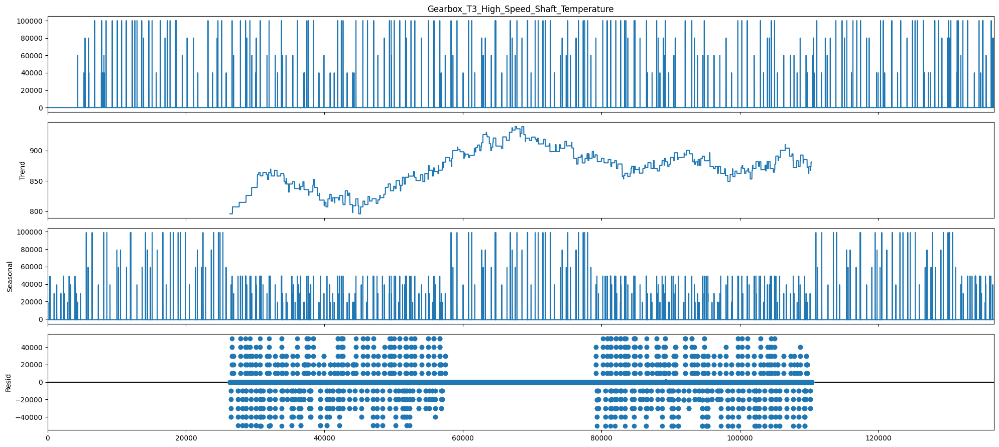

...

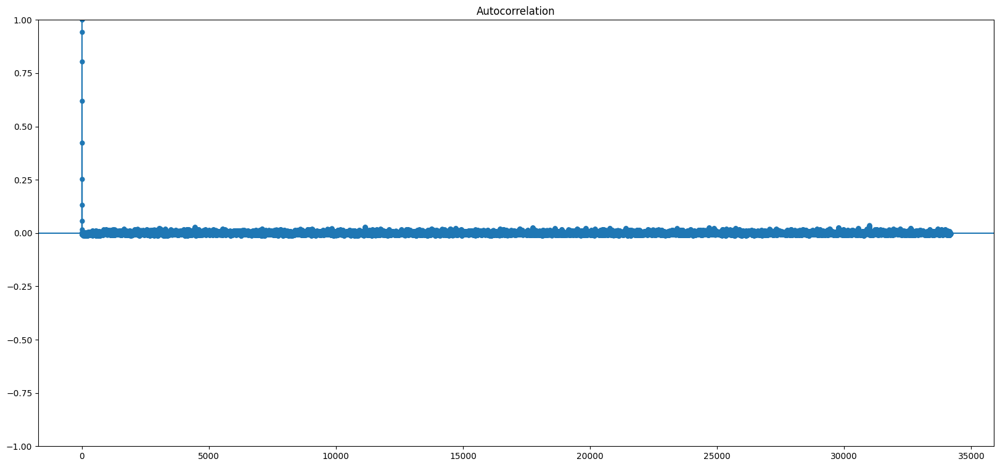

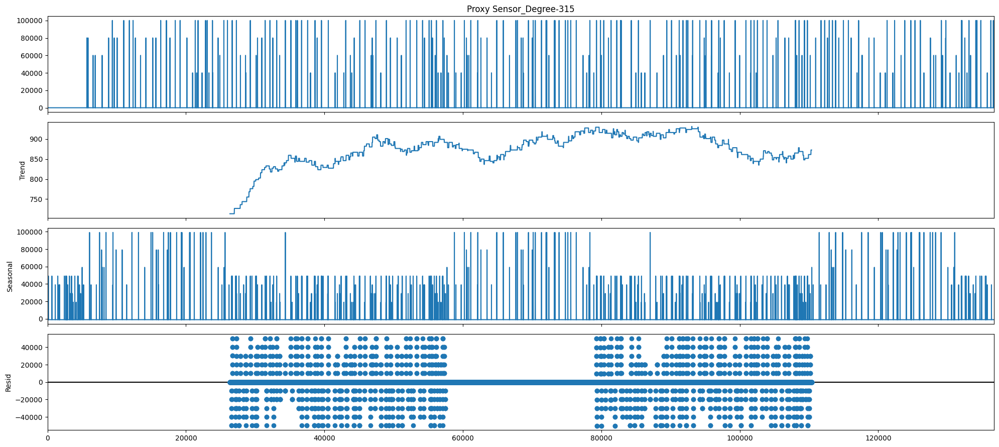

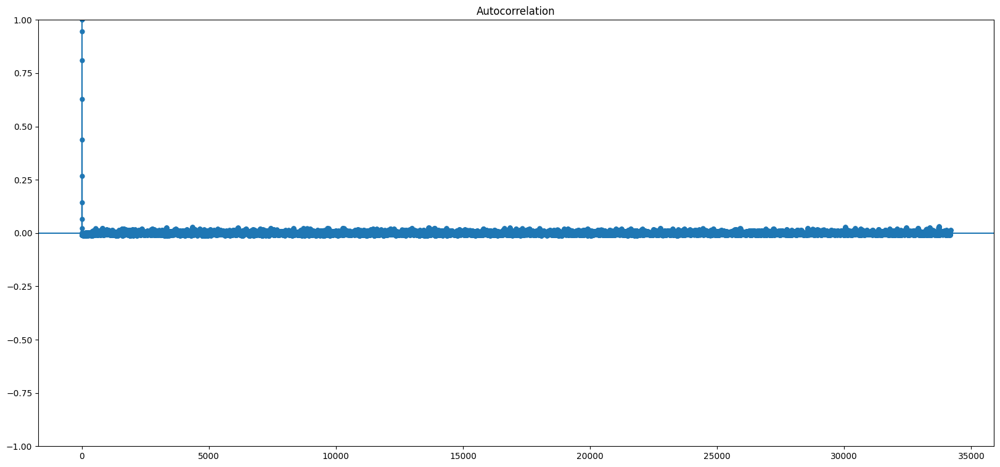

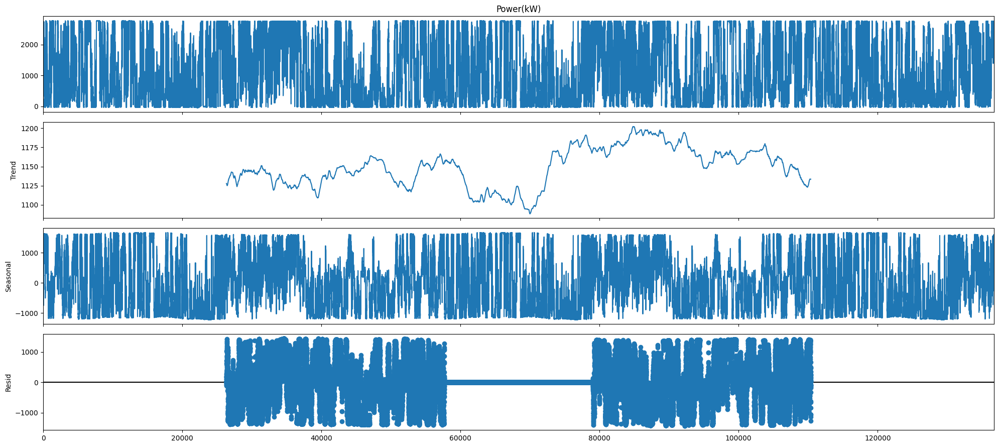

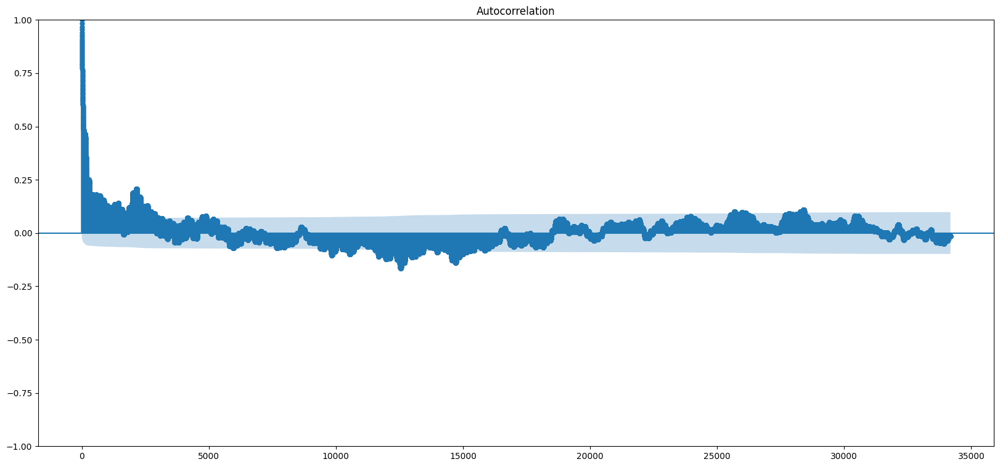

In [4]:
for column in data.columns:
    rcParams['figure.figsize'] = 20, 9

    decompose = seasonal_decompose(data[column], period=52704)
    decompose.plot()
    acf_plot = plot_acf(data[column], lags=len(data)//4)
    plt.show()

У большинства рядов тренд отсутсвует, что подтверждает тест на стационарность.
У вряменных рядов: Gearbox___, Torque, Converter_control___, Pitch_offset___, Circuit - тренд есть.